In [ ]:
install.packages('HiddenMarkov')
install.packages("parallel",repos = "http://cran.r-project.org")
install.packages("scatterplot3d")
library(HiddenMarkov)
library(parallel)
library(dplyr)
library(lubridate)


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message:
“package ‘parallel’ is a base package, and should not be updated”
Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘lubridate’


The following objects are masked from ‘package:base’:

    date, intersect, setdiff, union




In [ ]:
#Gardner-knopoff declustering
#Q_init <- matrix( c(-0.00005, 0.00001, 0.00004,
 #0.00003, -0.00005, 0.00002,
 #0.00002, 0.00003, -0.00005), byrow = TRUE, nrow = 3 )
lambda_init <- c(0.09,0.9,0.5)  # Initial guesses for Poisson rates in each state
delta_init <- c(0.5,0.3,0.2)
california_etas <-  read.csv("/content/sample_data/gardner_decluster_3mag_esi.csv",  header = TRUE, sep = ",",   stringsAsFactors = FALSE, na.strings = c("", "NA"))
california_etas$DateTime<- as.POSIXct(california_etas$DateTime, format = "%d-%b-%Y %H:%M:%S")
california_etas$DateTime <- format(california_etas$DateTime, "%Y-%m-%d %H:%M:%S")
california_etas$DateTime  <- as.POSIXlt(california_etas$DateTime, format = "%Y-%m-%d %H:%M:%S", tz=Sys.timezone())
california_etas$difference <- as.numeric((california_etas$DateTime - california_etas$DateTime[1]), units = "days")
mmpp_model <- mmpp(california_etas$difference , Q = Q_init, delta = delta_init, lambda = lambda_init, nonstat = TRUE)
estimated_model <- BaumWelch(mmpp_model, control = bwcontrol(maxiter = 500, tol = 1e-06, prt = TRUE, posdiff = TRUE, converge = expression(diff < tol)), PSOCKcluster=NULL,tmpfile=NULL)

iter = 1 
LL = -9659.36616740 
diff = Inf 

iter = 2 
LL = -8838.32835916 
diff = 821.0378 

iter = 3 
LL = -8830.34671118 
diff = 7.981648 

iter = 4 
LL = -8826.90406544 
diff = 3.442646 

iter = 5 
LL = -8824.40360705 
diff = 2.500458 

iter = 6 
LL = -8822.56781948 
diff = 1.835788 

iter = 7 
LL = -8821.18269082 
diff = 1.385129 

iter = 8 
LL = -8820.08000986 
diff = 1.102681 

iter = 9 
LL = -8819.18126815 
diff = 0.8987417 

iter = 10 
LL = -8818.44243701 
diff = 0.7388311 

iter = 11 
LL = -8817.82586485 
diff = 0.6165722 

iter = 12 
LL = -8817.29634086 
diff = 0.529524 

iter = 13 
LL = -8816.82431443 
diff = 0.4720264 

iter = 14 
LL = -8816.38745318 
diff = 0.4368612 

iter = 15 
LL = -8815.96976812 
diff = 0.4176851 

iter = 16 
LL = -8815.55988450 
diff = 0.4098836 

iter = 17 
LL = -8815.14946267 
diff = 0.4104218 

iter = 18 
LL = -8814.73201789 
diff = 0.4174448 

iter = 19 
LL = -8814.30207027 
diff = 0.4299476 

iter = 20 
LL = -8813.85450130 
diff = 0.447569 

iter

In [ ]:
estimated_model

$tau
   [1]     0.000000     5.992419    16.219977    23.597141    27.452118
   [6]    29.852060    29.864722    30.183322    50.004653    50.328553
  [11]    51.631713    56.005590    64.843044    68.960799    74.627801
  [16]    88.459780    94.639109    99.280949   106.738657   106.749769
  [21]   107.440660   109.642847   113.879375   116.036551   118.212928
  [26]   120.282766   130.604514   151.601319   152.866944   152.974606
  [31]   160.496655   160.551979   160.627060   164.884144   165.038692
  [36]   170.579606   183.394525   185.201794   190.282870   196.906331
  [41]   199.561204   204.631944   208.267350   208.357407   208.358889
  [46]   215.078507   215.838218   242.564549   244.392870   244.400185
  [51]   245.033102   250.127222   253.263866   265.965613   268.829514
  [56]   277.138762   284.215903   291.607350   294.100775   300.723090
  [61]   310.944745   312.313495   312.315220   325.761898   327.009329
  [66]   328.431968   343.586111   345.830984   355.471505 

In [ ]:
#Gruenthal_declustering

Q_init <- matrix( c(-0.0005, 0.0001, 0.0004,0.0003, -0.0005, 0.0002,0.0002, 0.0003, -0.0005), byrow = TRUE, nrow = 3 )
lambda_init <- c(0.9,0.05,0.5)
delta_init <- c(0.3,0.7,0.0)
california_etas <-  read.csv("/content/sample_data/gruenthal_decluster_3mag_esi.csv",  header = TRUE, sep = ",",   stringsAsFactors = FALSE, na.strings = c("", "NA"))
california_etas$DateTime<- as.POSIXct(california_etas$DateTime, format = "%d-%b-%Y %H:%M:%S")
california_etas$DateTime <- format(california_etas$DateTime, "%Y-%m-%d %H:%M:%S")
california_etas$DateTime  <- as.POSIXlt(california_etas$DateTime, format = "%Y-%m-%d %H:%M:%S", tz=Sys.timezone())
california_etas$difference <- as.numeric((california_etas$DateTime - california_etas$DateTime[1]), units = "days")
mmpp_model <- mmpp(california_etas$difference , Q = Q_init, delta = delta_init, lambda = lambda_init, nonstat = TRUE)
estimated_model <- BaumWelch(mmpp_model, control = bwcontrol(maxiter = 100000, tol = 1e-06, prt = TRUE, posdiff = TRUE, converge = expression(diff < tol)), PSOCKcluster=NULL,tmpfile=NULL)

iter = 1 
LL = -8631.60298143 
diff = Inf 

iter = 2 
LL = -7509.05791132 
diff = 1122.545 

iter = 3 
LL = -7490.89232416 
diff = 18.16559 

iter = 4 
LL = -7488.19345461 
diff = 2.69887 

iter = 5 
LL = -7487.41039209 
diff = 0.7830625 

iter = 6 
LL = -7487.03209747 
diff = 0.3782946 

iter = 7 
LL = -7486.76694916 
diff = 0.2651483 

iter = 8 
LL = -7486.54183453 
diff = 0.2251146 

iter = 9 
LL = -7486.33566478 
diff = 0.2061697 

iter = 10 
LL = -7486.14182638 
diff = 0.1938384 

iter = 11 
LL = -7485.95803806 
diff = 0.1837883 

iter = 12 
LL = -7485.78331180 
diff = 0.1747263 

iter = 13 
LL = -7485.61700307 
diff = 0.1663087 

iter = 14 
LL = -7485.45852260 
diff = 0.1584805 

iter = 15 
LL = -7485.30726310 
diff = 0.1512595 

iter = 16 
LL = -7485.16259317 
diff = 0.1446699 

iter = 17 
LL = -7485.02386884 
diff = 0.1387243 

iter = 18 
LL = -7484.89044650 
diff = 0.1334223 

iter = 19 
LL = -7484.76169270 
diff = 0.1287538 

iter = 20 
LL = -7484.63699026 
diff = 0.1247024 


In [ ]:
estimated_model

$tau
   [1]     0.000000     5.992419    16.219977    23.597141    27.452118
   [6]    29.852060    50.328553    51.631713    56.005590    64.843044
  [11]    74.627801    88.459780    94.639109    99.280949   106.738657
  [16]   106.749769   107.440660   113.879375   116.036551   130.604514
  [21]   151.601319   152.866944   160.496655   160.551979   160.627060
  [26]   164.884144   165.038692   170.579606   183.394525   185.201794
  [31]   190.282870   196.906331   199.561204   204.631944   208.267350
  [36]   208.357407   215.078507   215.838218   242.564549   244.392870
  [41]   245.033102   246.759606   250.127222   253.263866   265.965613
  [46]   268.829514   277.138762   284.215903   294.100775   300.723090
  [51]   310.944745   312.313495   312.315220   325.761898   327.009329
  [56]   328.431968   343.586111   345.830984   355.471505   359.222986
  [61]   375.197593   380.666551   383.281516   390.445174   395.609572
  [66]   395.842859   400.713322   405.315764   410.172014 

In [ ]:
#reasenberg_declustering
Q_init <- matrix( c(-0.05, 0.01, 0.03,0.01,
   0.02, -0.05, 0.02,0.01,
 0.02, 0.01, -0.05, 0.02,
   0.01, 0.02, 0.02,-0.05), byrow = TRUE, nrow = 4 )
print(Q_init)
delta_init<- c(0.2,0.4,0.1,0.3)
lambda_init<- c(0.4,0.8,0.5,0.1)
california_etas <-  read.csv("/content/sample_data/reasenberg_decluster_3mag_esi.csv",  header = TRUE, sep = ",",   stringsAsFactors = FALSE, na.strings = c("", "NA"))
california_etas$DateTime<- as.POSIXct(california_etas$DateTime, format = "%d-%b-%Y %H:%M:%S")
california_etas$DateTime <- format(california_etas$DateTime, "%Y-%m-%d %H:%M:%S")
california_etas$DateTime  <- as.POSIXlt(california_etas$DateTime, format = "%Y-%m-%d %H:%M:%S", tz=Sys.timezone())
california_etas$difference <- as.numeric((california_etas$DateTime - california_etas$DateTime[1]), units = "days")
mmpp_model <- mmpp(california_etas$difference , Q = Q_init, delta = delta_init, lambda = lambda_init, nonstat = TRUE)
estimated_model <- BaumWelch(mmpp_model, control = bwcontrol(maxiter = 500, tol = 1e-06, prt = TRUE, posdiff = TRUE, converge = expression(diff < tol)), PSOCKcluster=NULL,tmpfile=NULL)

      [,1]  [,2]  [,3]  [,4]
[1,] -0.05  0.01  0.03  0.01
[2,]  0.02 -0.05  0.02  0.01
[3,]  0.02  0.01 -0.05  0.02
[4,]  0.01  0.02  0.02 -0.05
iter = 1 
LL = -10814.95881622 
diff = Inf 

iter = 2 
LL = -10699.84024012 
diff = 115.1186 

iter = 3 
LL = -10671.59784660 
diff = 28.24239 

iter = 4 
LL = -10655.51882716 
diff = 16.07902 

iter = 5 
LL = -10642.65062953 
diff = 12.8682 

iter = 6 
LL = -10631.41670246 
diff = 11.23393 

iter = 7 
LL = -10621.73767019 
diff = 9.679032 

iter = 8 
LL = -10613.30362247 
diff = 8.434048 

iter = 9 
LL = -10604.86201547 
diff = 8.441607 

iter = 10 
LL = -10597.16472186 
diff = 7.697294 

iter = 11 
LL = -10591.60593890 
diff = 5.558783 

iter = 12 
LL = -10587.68594091 
diff = 3.919998 

iter = 13 
LL = -10584.69563196 
diff = 2.990309 

iter = 14 
LL = -10582.09534686 
diff = 2.600285 

iter = 15 
LL = -10579.39711528 
diff = 2.698232 

iter = 16 
LL = -10575.83775584 
diff = 3.559359 

iter = 17 
LL = -10570.53002135 
diff = 5.307734 

ite

In [ ]:
estimated_model

$tau
   [1]     0.000000     5.992419    16.219977    23.597141    27.452118
   [6]    29.852060    50.004653    50.328553    51.631713    56.005590
  [11]    64.843044    68.960799    74.627801    88.459780    94.639109
  [16]    99.280949   106.749769   107.440660   109.642847   110.522431
  [21]   113.879375   115.073160   116.036551   118.010312   118.212928
  [26]   119.463843   120.282766   130.604514   151.601319   152.866944
  [31]   152.974606   154.618993   160.496655   160.551979   160.627060
  [36]   160.833067   164.884144   165.038692   170.579606   170.686539
  [41]   183.394525   183.810868   184.112674   185.201794   190.282870
  [46]   196.906331   199.561204   204.631944   208.267350   208.358889
  [51]   215.078507   215.838218   223.421111   227.764410   237.443657
  [56]   242.564549   244.392870   245.033102   246.759606   250.127222
  [61]   250.613032   251.621690   253.263866   256.427801   265.965613
  [66]   268.829514   277.138762   282.129896   284.215903 

In [ ]:
#uhrhammer_declustering
Q_init <- matrix( c(-0.005, 0.001, 0.003,0.001,
  0.002, -0.005, 0.001,0.002,
  0.002, 0.001, -0.005, 0.002,
  0.002, 0.001, 0.002,-0.005), byrow = TRUE, nrow = 4 )
delta_init<- c(0.7,0.0,0.1,0.2)
lambda_init<- c(0.04,0.4,0.7,0.2)
california_etas <-  read.csv("/content/sample_data/uharhammer_decluster_3mag_esi.csv",  header = TRUE, sep = ",",   stringsAsFactors = FALSE, na.strings = c("", "NA"))
california_etas$DateTime<- as.POSIXct(california_etas$DateTime, format = "%d-%b-%Y %H:%M:%S")
california_etas$DateTime <- format(california_etas$DateTime, "%Y-%m-%d %H:%M:%S")
california_etas$DateTime  <- as.POSIXlt(california_etas$DateTime, format = "%Y-%m-%d %H:%M:%S", tz=Sys.timezone())
california_etas$difference <- as.numeric((california_etas$DateTime - california_etas$DateTime[1]), units = "days")
mmpp_model <- mmpp(california_etas$difference , Q = Q_init, delta = delta_init, lambda = lambda_init, nonstat = TRUE)
estimated_model <- BaumWelch(mmpp_model, control = bwcontrol(maxiter = 25000, tol = 1e-06, prt = TRUE, posdiff = TRUE, converge = expression(diff < tol)), PSOCKcluster=NULL,tmpfile=NULL)

iter = 1 
LL = -10341.86401011 
diff = Inf 

iter = 2 
LL = -10272.25603259 
diff = 69.60798 

iter = 3 
LL = -10267.35039572 
diff = 4.905637 

iter = 4 
LL = -10264.62325996 
diff = 2.727136 

iter = 5 
LL = -10261.50899220 
diff = 3.114268 

iter = 6 
LL = -10256.72429098 
diff = 4.784701 

iter = 7 
LL = -10250.34846760 
diff = 6.375823 

iter = 8 
LL = -10244.01074062 
diff = 6.337727 

iter = 9 
LL = -10239.48780418 
diff = 4.522936 

iter = 10 
LL = -10236.67939545 
diff = 2.808409 

iter = 11 
LL = -10234.77289545 
diff = 1.9065 

iter = 12 
LL = -10233.33614998 
diff = 1.436745 

iter = 13 
LL = -10232.16173811 
diff = 1.174412 

iter = 14 
LL = -10231.14343563 
diff = 1.018302 

iter = 15 
LL = -10230.22352622 
diff = 0.9199094 

iter = 16 
LL = -10229.36734938 
diff = 0.8561768 

iter = 17 
LL = -10228.55029943 
diff = 0.8170499 

iter = 18 
LL = -10227.75092434 
diff = 0.7993751 

iter = 19 
LL = -10226.94724158 
diff = 0.8036828 

iter = 20 
LL = -10226.11566574 
diff = 0.

In [ ]:
estimated_model

$tau
   [1]     0.000000     5.992419    16.219977    23.597141    27.452118
   [6]    29.852060    29.864722    30.183322    50.004653    50.328553
  [11]    51.631713    56.005590    64.843044    68.960799    74.627801
  [16]    88.459780    94.639109    99.280949   106.738657   106.749769
  [21]   107.440660   109.642847   113.879375   113.892222   113.892674
  [26]   116.036551   118.010312   118.212928   120.282766   130.604514
  [31]   151.601319   152.866944   152.974606   154.618993   160.496655
  [36]   160.551979   160.627060   160.833067   164.884144   165.038692
  [41]   170.579606   170.686539   183.394525   183.810868   184.112674
  [46]   185.201794   190.282870   196.906331   199.561204   204.631944
  [51]   208.267350   208.357407   208.358889   215.078507   215.838218
  [56]   223.421111   227.764410   237.443657   242.564549   244.392870
  [61]   244.400185   245.033102   245.401829   250.127222   253.263866
  [66]   265.965613   268.829514   277.138762   284.215903 

In [ ]:
#nearest_neighbour_declustering
#Q_init <- matrix(c(-0.4, 0.4, 0.5, -0.5), byrow = TRUE, nrow = 2)
#Q_init <- matrix( c(-0.05, 0.01, 0.04,
 #0.03, -0.05, 0.02,
# 0.02, 0.03, -0.05), byrow = TRUE, nrow = 3 )
california_etas <-  read.csv("/content/sample_data/total_background_3mag_nn_esi.csv",  header = TRUE, sep = ",",   stringsAsFactors = FALSE, na.strings = c("", "NA"))
california_etas$datetime  <- as.POSIXlt(california_etas$datetime, format = "%Y-%m-%dT%H:%M:%OS", tz=Sys.timezone())
california_etas <- california_etas[order(california_etas$datetime), ]
california_etas$difference <- as.numeric((california_etas$datetime - california_etas$datetime[1]), units = "days")
mmpp_model <- mmpp(california_etas$difference , Q = Q_init, delta = delta_init, lambda = lambda_init, nonstat = TRUE)
estimated_model <- BaumWelch(mmpp_model, control = bwcontrol(maxiter = 50000, tol = 1e-06, prt = TRUE, posdiff = TRUE, converge = expression(diff < tol)), PSOCKcluster=NULL,tmpfile=NULL)

iter = 1 
LL = -9181.12098857 
diff = Inf 

iter = 2 
LL = -8903.98016165 
diff = 277.1408 

iter = 3 
LL = -8887.12183034 
diff = 16.85833 

iter = 4 
LL = -8883.49002969 
diff = 3.631801 

iter = 5 
LL = -8882.18799172 
diff = 1.302038 

iter = 6 
LL = -8881.54231211 
diff = 0.6456796 

iter = 7 
LL = -8881.14689137 
diff = 0.3954207 

iter = 8 
LL = -8880.86970837 
diff = 0.277183 

iter = 9 
LL = -8880.65661829 
diff = 0.2130901 

iter = 10 
LL = -8880.48106998 
diff = 0.1755483 

iter = 11 
LL = -8880.32840382 
diff = 0.1526662 

iter = 12 
LL = -8880.18993629 
diff = 0.1384675 

iter = 13 
LL = -8880.06030838 
diff = 0.1296279 

iter = 14 
LL = -8879.93612668 
diff = 0.1241817 

iter = 15 
LL = -8879.81520425 
diff = 0.1209224 

iter = 16 
LL = -8879.69611416 
diff = 0.1190901 

iter = 17 
LL = -8879.57791815 
diff = 0.118196 

iter = 18 
LL = -8879.45999786 
diff = 0.1179203 

iter = 19 
LL = -8879.34194759 
diff = 0.1180503 

iter = 20 
LL = -8879.22350501 
diff = 0.1184426 

i

In [ ]:
estimated_model

$tau
   [1]     0.000000     5.992426    16.219984    23.597148    27.452127
   [6]    50.004660    50.328560    51.631721    56.005595    64.843050
  [11]    68.960799    74.627804    88.459784    94.639110    99.280956
  [16]   106.738661   107.440660   109.642847   113.879384   116.036552
  [21]   118.212927   120.282772   130.604519   151.601323   152.866943
  [26]   154.618998   160.496662   160.551986   160.627062   160.833070
  [31]   164.884144   165.038697   170.579608   185.201794   190.282875
  [36]   196.906330   199.561203   204.631946   208.267350   208.357405
  [41]   208.358890   215.078511   215.838223   223.421119   237.443662
  [46]   242.564553   244.392873   245.033101   250.127222   253.263869
  [51]   256.427804   265.965612   268.829520   277.138766   282.129900
  [56]   284.215901   286.544725   288.197368   288.202382   291.607356
  [61]   294.100783   300.723088   310.944750   312.313502   312.315228
  [66]   325.761904   327.009328   328.431972   343.586116 

In [ ]:
-1046.0143619 1046.0143619
[2,]     0.3553414   -0.3553414

In [ ]:
#stochastic_declustering
#Q_init <- matrix(c(-0.0004, 0.0004, 0.0005, -0.0005), byrow = TRUE, nrow = 2)

lambda_init <- c(0.002, 0.9)  # Initial guesses for Poisson rates in each state
delta_init <- c(0.9, 0.1)

california_etas <-  read.csv("/content/sample_data/background_data_stochastic__3mag_esi.csv",  header = TRUE, sep = ",",   stringsAsFactors = FALSE, na.strings = c("", "NA"))
california_etas$datetime  <- as.POSIXlt(california_etas$datetime, format = "%Y-%m-%d %H:%M:%S", tz=Sys.timezone())
california_etas$difference <- as.numeric((california_etas$datetime - california_etas$datetime[1]), units = "days")
mmpp_model <- mmpp(california_etas$difference , Q = Q_init, delta = delta_init, lambda = lambda_init, nonstat = TRUE)
estimated_model <- BaumWelch(mmpp_model, control = bwcontrol(maxiter = 1000, tol = 1e-06, prt = TRUE, posdiff = TRUE, converge = expression(diff < tol)), PSOCKcluster=NULL,tmpfile=NULL)

iter = 1 
LL = -11379.95436985 
diff = Inf 

iter = 2 
LL = -6814.63103774 
diff = 4565.323 

iter = 3 
LL = -6753.42202676 
diff = 61.20901 

iter = 4 
LL = -6744.96779275 
diff = 8.454234 

iter = 5 
LL = -6742.75374129 
diff = 2.214051 

iter = 6 
LL = -6741.75649975 
diff = 0.9972415 

iter = 7 
LL = -6741.03604127 
diff = 0.7204585 

iter = 8 
LL = -6740.36459299 
diff = 0.6714483 

iter = 9 
LL = -6739.67747963 
diff = 0.6871134 

iter = 10 
LL = -6738.95241717 
diff = 0.7250625 

iter = 11 
LL = -6738.17819284 
diff = 0.7742243 

iter = 12 
LL = -6737.34570164 
diff = 0.8324912 

iter = 13 
LL = -6736.44510946 
diff = 0.9005922 

iter = 14 
LL = -6735.46471119 
diff = 0.9803983 

iter = 15 
LL = -6734.39018964 
diff = 1.074522 

iter = 16 
LL = -6733.20387643 
diff = 1.186313 

iter = 17 
LL = -6731.88387728 
diff = 1.319999 

iter = 18 
LL = -6730.40300319 
diff = 1.480874 

iter = 19 
LL = -6728.72749051 
diff = 1.675513 

iter = 20 
LL = -6726.81559154 
diff = 1.911899 

iter

In [ ]:
estimated_model

$tau
   [1]     0.000000     5.992419    16.219977    23.597141    27.452118
   [6]    50.004653    50.328553    51.631713    56.005590    64.843044
  [11]    68.960799    74.627801    88.459780    94.639109    99.280949
  [16]   106.738657   107.440660   109.642847   116.036551   118.212928
  [21]   120.282766   130.604514   151.601319   152.866944   154.618993
  [26]   160.496655   160.551979   160.627060   160.833067   164.884144
  [31]   165.038692   170.579606   185.201794   190.282870   196.906331
  [36]   199.561204   204.631944   208.267350   208.357025   215.078507
  [41]   215.838218   223.421111   237.443657   242.564549   244.392870
  [46]   245.033102   250.127222   253.263866   265.965613   268.829514
  [51]   277.138762   284.216481   288.197361   300.723160   310.944745
  [56]   312.313495   325.761898   327.009329   328.431968   343.586111
  [61]   345.830984   355.471505   359.222986   375.197593   380.666551
  [66]   383.281516   388.363819   390.445174   395.609572 

In [ ]:
Q<-matrix(c(-90.492662879 ,  9.049266e+01 , 7.067953e-56,5.314018597 , -5.314259e+00 , 2.404109e-04,
 0.002809412,  7.973592e-261, -2.809412e-03),byrow=TRUE, nrow=3)
lambda=c(3.2733709642 ,0.0004360816, 0.2519378484)
#Q<-matrix(c(-0.0001006728,  0.0001006728,0.0002958959, -0.0002958959),byrow=TRUE, nrow=2)
#lambda=c(0.1361194, 0.2277395)
#Q<-matrix(c(-2.965830e-03 ,   0.00296583 , 5.606102e-13, 5.921256e-109 ,  -0.33526689,  3.352669e-01,
#1.249803e+00 ,1065.20285312 ,-1.066453e+03),byrow=TRUE, nrow=3)


#lambda=c(0.3705976 ,  0.1813226, 163.5672511)



In [ ]:
#Q<-matrix(c(-3.288969e-01 , 3.288969e-01,  8.767837e-49,1.064124e+03, -1.065395e+03,  1.270766e+00,2.962361e-03,  1.321830e-10, -2.962361e-03),byrow=TRUE, nrow=3)#NN
 #Q<-matrix(c(-5.421648e-04 , 0.0005421646,  1.836902e-10,
 #4.530870e-29, -0.0013086660,  1.308666e-03,
 #3.222949e-03 , 0.0041723300, -7.395279e-03),byrow=TRUE, nrow=3)#gardner
 #Q<-matrix(c(-2.384599e-04,  2.384599e-04 , 2.489689e-128,
 # 1.318220e-17, -4.662891e-02 ,  4.662891e-02,
 # 4.424303e-22,  1.196595e-09,  -1.196595e-09),byrow=TRUE, nrow=3)#gruenthal
 #Q<-matrix(c(-9.843892e-03 , 5.042574e-04 , 2.528119e-04 , 9.086823e-03,
 #1.506405e-14, -1.074112e-01,  1.074112e-01 , 1.021356e-92,
 # 1.105644e-02 , 2.262227e-18, -1.105644e-02,  5.061722e-70,
 #4.532681e-03 , 2.947716e-04,  6.378106e-42 ,-4.827452e-03),byrow=TRUE, nrow=4)#reasenberg
 #Q<-matrix(c(-3.901566e-02 , 3.094249e-31 ,  0.03901566,  4.940656e-324,
  #4.709408e-02, -1.374146e+02, 135.27512533 ,  2.092410e+00,
#1.482197e-323 , 1.992349e+00 , -1.99234935,   8.674215e-09,
  #4.940656e-324,  7.270784e-10 ,  0.06656516 , -6.656516e-02),byrow=TRUE, nrow=4)#uhrhammer
 Q<-matrix(c(-2.518569e-04 , 2.518569e-04,  1.082647e-11 ,-1.082647e-11),byrow=TRUE, nrow=2)#stochastic
print(Q)

              [,1]          [,2]
[1,] -2.518569e-04  2.518569e-04
[2,]  1.082647e-11 -1.082647e-11


In [ ]:
#lambda=c(0.1817836 ,165.0438496 ,  0.3705935)#nn
#lambda=c(1.3815189, 14.7129524 , 0.1902443 , 0.1458215)# uh
#lambda=c(0.2101040, 0.2623789, 0.3778138)# grardner
#lambda<-c(0.2091345, 0.9294355, 0.1771721)#gruenthal
#lambda<-c(0.4667534, 4.5216312, 0.9596577, 0.2619220)#resenberg
#lambda=c(0.2245018, 0.1357613) #stochastic
print(lambda)

[1] 0.2245018 0.1357613


In [ ]:
# Convert to desired units (e.g., hours)
tau <- c(0, as.numeric(diff(california_etas$DateTime), units = "days"))
# Print results
print(tau)

   [1] 0.000000e+00 5.992419e+00 1.022756e+01 7.377164e+00 3.854977e+00
   [6] 2.399942e+00 2.047649e+01 1.303160e+00 4.373877e+00 8.837454e+00
  [11] 9.784757e+00 1.383198e+01 6.179329e+00 4.641840e+00 7.457708e+00
  [16] 1.111111e-02 6.908912e-01 6.438715e+00 2.157176e+00 1.456796e+01
  [21] 2.099681e+01 1.265625e+00 7.629711e+00 5.532407e-02 7.508102e-02
  [26] 4.257083e+00 1.545486e-01 5.540914e+00 1.281492e+01 1.807269e+00
  [31] 5.081076e+00 6.623461e+00 2.654873e+00 5.070741e+00 3.635405e+00
  [36] 9.005787e-02 6.721100e+00 7.597106e-01 2.672633e+01 1.828322e+00
  [41] 6.402315e-01 1.726505e+00 3.367616e+00 3.136644e+00 1.270175e+01
  [46] 2.863900e+00 8.309248e+00 7.077141e+00 9.884873e+00 6.622315e+00
  [51] 1.022166e+01 1.368750e+00 1.724537e-03 1.344668e+01 1.247431e+00
  [56] 1.422639e+00 1.515414e+01 2.244873e+00 9.640521e+00 3.751481e+00
  [61] 1.597461e+01 5.468958e+00 2.614965e+00 7.163657e+00 5.164398e+00
  [66] 2.332870e-01 4.870463e+00 4.602442e+00 4.856250e+00 2.773

In [ ]:
delta<- c(0,1,0)
result<-forwardback.mmpp(tau, Q, delta, lambda=lambda, fortran = TRUE, fwd.only = FALSE)

In [ ]:
result <- forwardback.mmpp(tau, Q, delta, lambda, fortran = TRUE, fwd.only = FALSE)
logalpha <- result$logalpha
logbeta <- result$logbeta
alpha <- exp(logalpha)
beta <- exp(logbeta)
smoothing_probs <- (alpha * beta) / rowSums(alpha * beta)

In [ ]:
smoothing_probs

0.0000000,1.0000000000,0.0000000000
NaN,NaN,NaN
0.9974482,0.0024203641,0.0001314833
0.9972570,0.0024198988,0.0003230562
0.9971318,0.0024195938,0.0004486120
0.9970888,0.0024194881,0.0004916925
0.9970855,0.0024194781,0.0004950131
0.9969603,0.0024191767,0.0006205012
0.9969517,0.0024191534,0.0006291932
0.9969607,0.0024191738,0.0006201469
0.9970055,0.0024192831,0.0005751754


In [ ]:
#gardner
#pdf("mmpp_plot_gardner.pdf")
#par(mar = c(5, 6, 4, 2) + 0.1)
postscript("my_plot_gardner.eps", width = 7, height = 5, horizontal = FALSE, paper = "special", onefile = FALSE)
plot(smoothing_probs[, 1], col = "red", pch = 19, cex = 0.6, xlab = "Time", ylab = "State probability",
     ylim = c(0, 1), xaxt = "n", cex.lab=1.6, cex.axis=1.6 )

# Add points
points(smoothing_probs[, 2], col = "green", pch = 16,cex = 0.6, cex.lab=1.6, cex.axis=1.6 )
points(smoothing_probs[, 3], col = "blue", pch = 16,cex = 0.6, cex.lab=1.6, cex.axis=1.6 )
# Add vertical lines
abline(v = c(1142, 1797 ,2659 ,3504), col = "black", lwd = 2, lty = 2)
axis(1, at = c(1,1142, 1797 ,2659 ,3504), labels = c(1981, 1992, 1999, 2010, 2019), cex.axis=1.6)
# Add text labels
#text(1105, 0.60, "7.3M", col = "black", pos = 4,font = 2)
#text(1778, 0.75, "7.1M", col = "black", pos = 4,font = 2)
#text(2610, 0.62, "7.2M", col = "black", pos = 4,font = 2)
#text(3460, 0.78, "7.1M", col = "black", pos = 4, font = 2,cex = 1)
dev.off()

agg_record_927098545 
                   2

null device 
          1

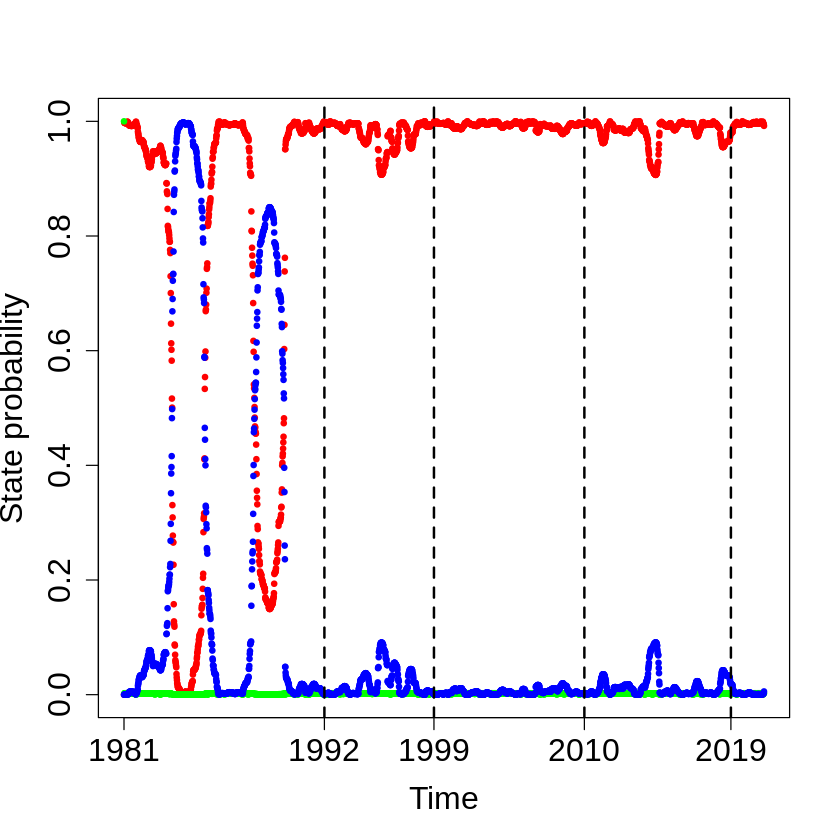

In [ ]:
#2650 2028 1363 881 gruenthal
#pdf("mmpp_plot_gruenthal.pdf")
#par(mar = c(5, 6, 4, 2) + 0.1)
#postscript("my_plot_gruenthal.eps", width = 7, height = 5, horizontal = FALSE, paper = "special", onefile = FALSE)
plot(smoothing_probs[, 1], col = "red", pch = 19, cex = 0.6, xlab = "Time", ylab = "State probability",
     ylim = c(0, 1), xaxt = "n",cex.lab=1.6, cex.axis=1.6)

# Add points
points(smoothing_probs[, 2], col = "green", pch = 19, cex = 0.6, cex.lab=1.6, cex.axis=1.6)
points(smoothing_probs[, 3], col = "blue", pch = 19, cex = 0.6, cex.lab=1.6, cex.axis=1.6 )

# Add vertical lines
abline(v = c(879,1359  ,2018 ,2660), col = "black", lwd = 2, lty = 2)
axis(1, at = c(1,879,1359 ,2018,2660), labels = c(1981, 1992, 1999, 2010, 2019), cex.axis=1.6)
# Add text labels
#text(881, 0.8, "7.3M", col = "black", pos = 4,font = 2)
#text(1363, 0.9, "7.1M", col = "black", pos = 4,font = 2)
#text(2028, 0.8, "7.2M", col = "black", pos = 4,font = 2)
#text(2650, 0.8, "7.1M", col = "black", pos = 4,font = 2)
dev.off()

In [ ]:
#reasenberg
#pdf("mmpp_plot_reasenberg.pdf")
#par(mar = c(5, 6, 4, 2) + 0.1)
postscript("my_plot_reasenberg.eps", width = 7, height = 5, horizontal = FALSE, paper = "special", onefile = FALSE)
plot(smoothing_probs[, 1], col = "red",pch = 19, cex = 0.5,xlab = "Time", ylab = "State probability",
     ylim = c(0, 1), xaxt = "n",cex.lab=1.6, cex.axis=1.6)

# Add points
points(smoothing_probs[, 2], col = "green", pch = 19, cex = 0.5,cex.lab=1.6, cex.axis=1.6)
points(smoothing_probs[, 3], col = "blue", pch = 19, cex = 0.5,cex.lab=1.6, cex.axis=1.6)
points(smoothing_probs[, 4], col = "violet", pch = 19, cex = 0.5,cex.lab=1.6, cex.axis=1.6)
# Add vertical lines
abline(v = c(5200, 4014, 1543, 2787), col = "black", lwd = 2, lty = 2)
axis(1, at = c(1,1543, 2787, 4014, 5200), labels = c(1981, 1992, 1999, 2010, 2019),cex.lab=1.6, cex.axis=1.6)
# Add text labels
#text(1543, 0.59, "7.3M", col = "black", pos = 4,font = 2)
#text(4014, 0.75, "7.2M", col = "black", pos = 4,font = 2)
#text(2850, 0.62, "7.1M", col = "black", pos = 4,font = 2)
#text(5200, 0.78, "7.1M", col = "black", pos = 4, cex = 1,font = 2)
dev.off()

agg_record_1542758133 
                    2

null device 
          1

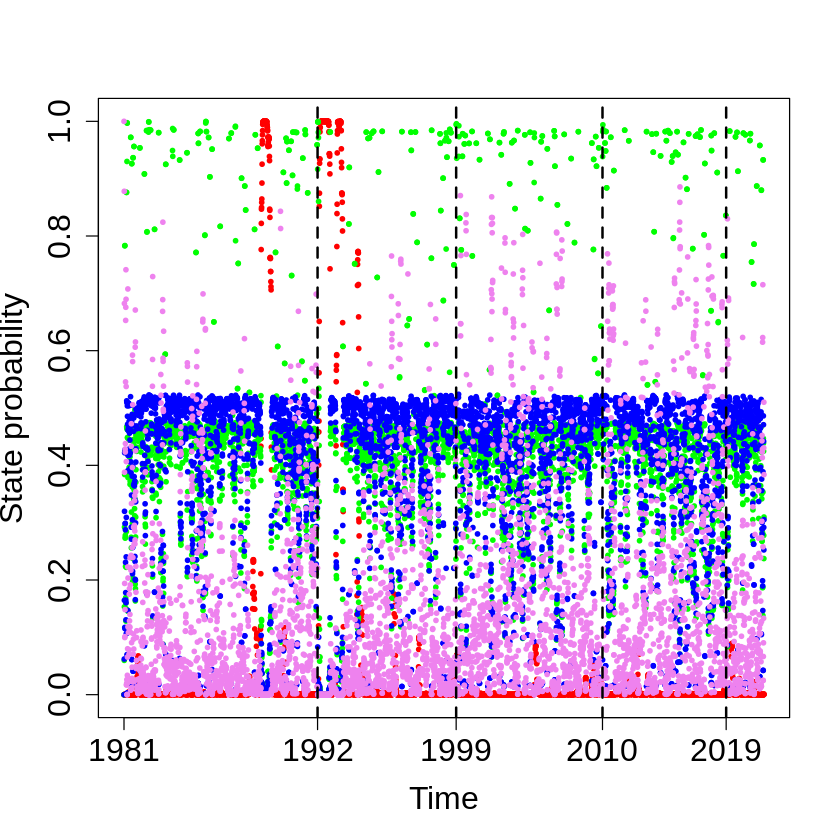

In [ ]:
#uhrhammer
#pdf("mmpp_plot_uhrhammer.pdf")
#par(mar = c(5, 6, 4, 2) + 0.1)
#postscript("my_plot_uhrhammer.eps", width = 7, height = 5, horizontal = FALSE, paper = "special", onefile = FALSE)
plot(smoothing_probs[, 1], col = "red", pch = 19, cex = 0.5,xlab = "Time", ylab = "State probability",
     ylim = c(0, 1), xaxt = "n",cex.lab=1.6, cex.axis=1.6)

# Add points
points(smoothing_probs[, 2], col = "green",pch = 19, cex = 0.5,cex.lab=1.6, cex.axis=1.6)
points(smoothing_probs[, 3], col = "blue", pch = 19, cex = 0.5,cex.lab=1.6, cex.axis=1.6)
points(smoothing_probs[, 4], col = "violet", pch = 19, cex = 0.5,cex.lab=1.6, cex.axis=1.6)
# Add vertical lines
abline(v = c(1505, 2582, 3719 ,4680), col = "black", lwd = 2, lty = 2)
axis(1, at = c(1, 1505, 2582, 3719 ,4680), labels = c('1981',"1992", "1999", "2010", "2019"),cex.lab=1.6, cex.axis=1.6)
# Add text labels
#text(881, 0.59, "7.3M", col = "black", pos = 4,font = 2)
#text(1363, 0.75, "7.1M", col = "black", pos = 4,font = 2)
#text(2024, 0.62, "7.2M", col = "black", pos = 4,font = 2)
#text(2640, 0.78, "7.1M", col = "black", pos = 4,,font = 2, cex = 1)
dev.off()

null device 
          1

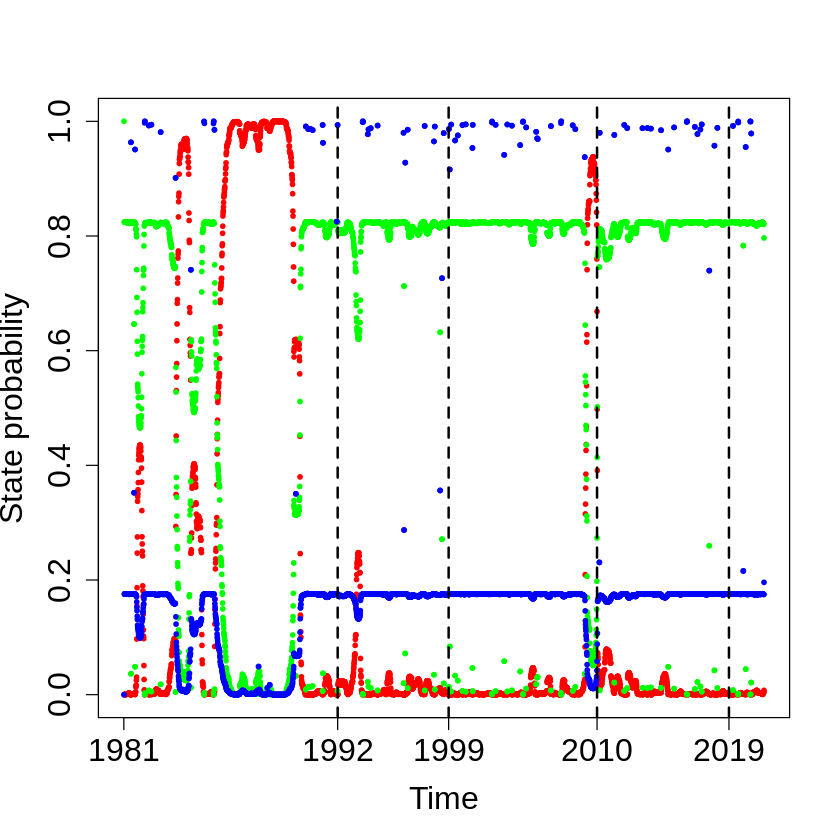

In [ ]:
#nearest
#postscript("my_plot_nearest_neighbour.eps", width = 7, height = 5, horizontal = FALSE, paper = "special", onefile = FALSE)
#pdf("mmpp_plot_nearest.pdf")
#par(mar = c(5, 6, 4, 2) + 0.1)
plot(smoothing_probs[, 1], col = "red", pch = 19, cex = 0.5,xlab = "Time", ylab = "State probability",
     ylim = c(0, 1),  xaxt = "n",cex.lab=1.6, cex.axis=1.6)

# Add points
points(smoothing_probs[, 2], col = "green", pch = 19, cex = 0.5,cex.lab=1.6, cex.axis=1.6)
points(smoothing_probs[, 3], col = "blue", pch = 19, cex = 0.5,cex.lab=1.6, cex.axis=1.6)
abline(v = c(1245, 1891 ,2755, 3523), col = "black", lwd = 2, lty = 2)
axis(1, at = c(0, 1245, 1891 ,2755, 3523), labels = c('1981',"1992", "1999", "2010", "2019"),cex.lab=1.6, cex.axis=1.6)
# Add text labels
#text(1083, 0.59, "7.3M", col = "black", pos = 4,font = 2)
#text(1628, 0.75, "7.1M", col = "black", pos = 4,font = 2)
#text(2334, 0.62, "7.2M", col = "black", pos = 4,font = 2)
#text(2992, 0.78, "7.1M", col = "black", pos = 4,,font = 2, cex = 1)

dev.off()


In [ ]:
#stochastic
#pdf("mmpp_plot_stochastic.pdf")
#par(mar = c(5, 6, 4, 2) + 0.1)
postscript("my_plot_stochastic.eps", width = 7, height = 5, horizontal = FALSE, paper = "special", onefile = FALSE)
plot(smoothing_probs[, 1], col = "red", pch = 19, cex = 0.5,xlab = "Time", ylab = "State probability",
     ylim = c(0, 1), xaxt = "n",cex.lab=1.6, cex.axis=1.6)
points(smoothing_probs[, 2], col = "green", pch = 19, cex = 0.5,cex.lab=1.6, cex.axis=1.6)
abline(v = c(923 , 1297 ,1832, 2268), col = "black", lwd = 2, lty = 2)
axis(1, at = c(1,923 , 1297 ,1832, 2268), labels = c('1981',"1992", "1999", "2010", "2019"),cex.lab=1.6, cex.axis=1.6)
# Add text labels
#28june1992
#October 16, 1999
#4th4 2010
#5th july2019
#text(580, 0.59, "7.3M", col = "black", pos = 4,font = 2)
#text(747, 0.75, "7.1M", col = "black", pos = 4,font = 2)
#text(979, 0.62, "7.2M", col = "black", pos = 4,font = 2)
#text(1134, 0.78, "7.1M", col = "black", pos = 4,font = 2, cex = 1)
dev.off()

agg_record_1307992208 
                    2